In [2]:
import deepxde as dde 
import matplotlib.pyplot as plt
import numpy as np 
import torch 

Using backend: pytorch
Other supported backends: tensorflow.compat.v1, tensorflow, jax, paddle.
paddle supports more examples now and is recommended.


In [3]:
def burgers_equation(x, y):
    dy_x = dde.grad.jacobian(y, x, i=0, j=0)
    dy_t = dde.grad.jacobian(y, x, i=0, j=1)
    dy_xx = dde.grad.hessian(y, x, i=0, j=0)
    return dy_t + y * dy_x - 0.01 / dde.backend.torch.pi * dy_xx

def gen_testdata():
    data = np.load("../dataset/Burgers.npz")
    t, x, exact = data["t"], data["x"], data["usol"].T
    xx, tt = np.meshgrid(x, t)
    X = np.vstack((np.ravel(xx), np.ravel(tt))).T
    y = exact.flatten()[:, None]
    return X, y

# define the geometry and time domain
geom = dde.geometry.Interval(-1, 1)
timedomain = dde.geometry.TimeDomain(0, 0.99)
geomtime = dde.geometry.GeometryXTime(geom, timedomain)

# define the boundary and initial conditions
bc = dde.icbc.DirichletBC(geomtime, lambda x: 0, lambda _, on_boundary: on_boundary)
ic = dde.icbc.IC(
    geomtime,
    lambda x: -dde.backend.torch.sin(
        dde.backend.torch.pi * dde.backend.as_tensor(x[:, 0:1])
    ),
    lambda _, on_initial: on_initial,
)
net = dde.maps.FNN([2] + [20] * 3 + [1], "tanh", "Glorot normal")


def output_transform(x, y):
    return -torch.sin(np.pi * x[:, 0:1]) + (1 - x[:, 0:1] ** 2) * (x[:, 1:]) * y

net.apply_output_transform(output_transform)
ic_bcs = []

data = dde.data.TimePDE(
    geomtime,
    burgers_equation,
    ic_bcs=ic_bcs,
)

model = dde.Model(data, net)
model.compile("adam", lr=0.001)

Compiling model...
'compile' took 0.457663 s



In [4]:
X, y = gen_testdata()

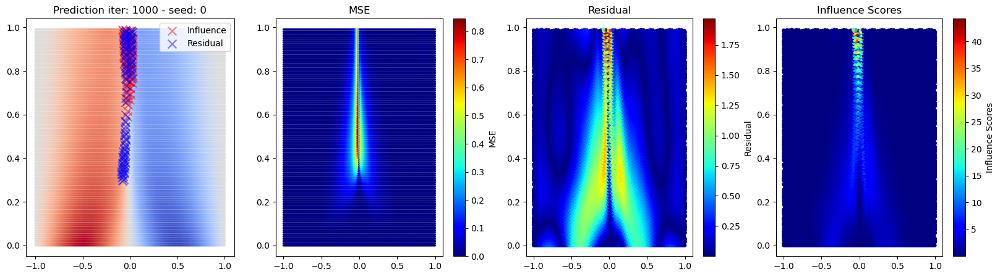

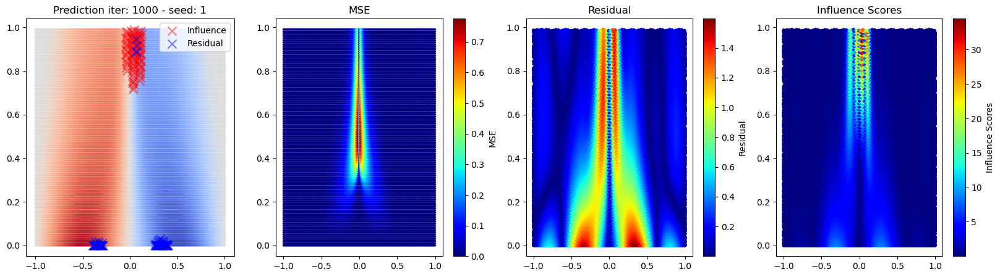

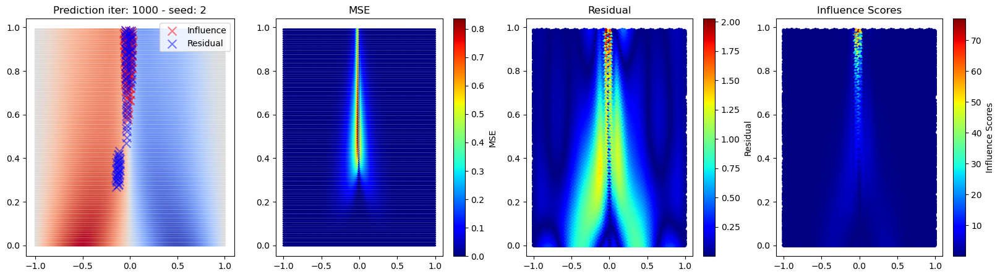

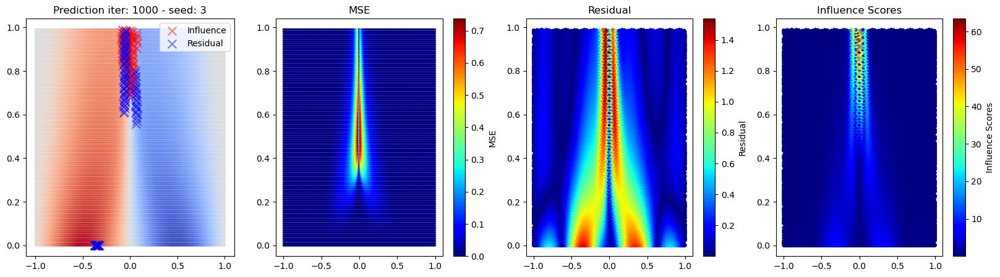

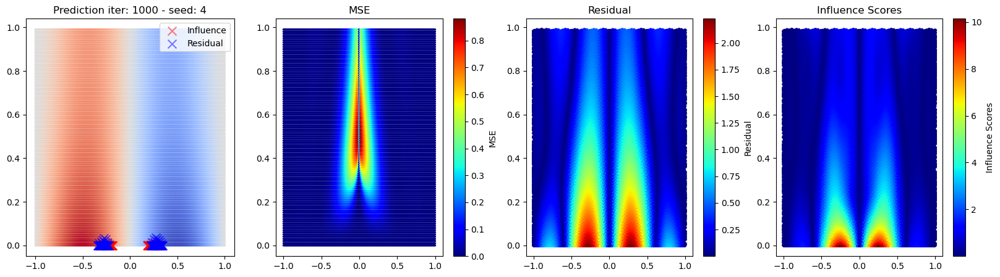

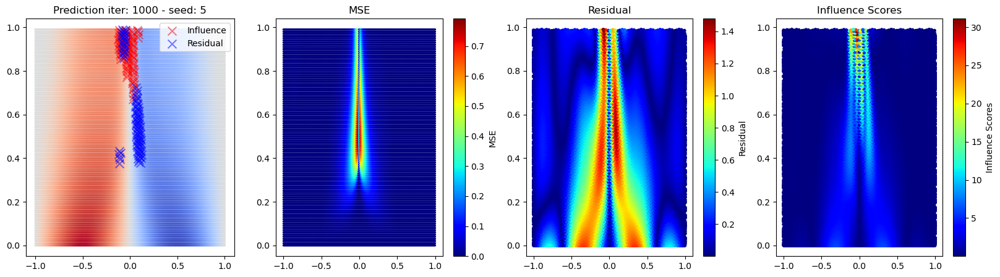

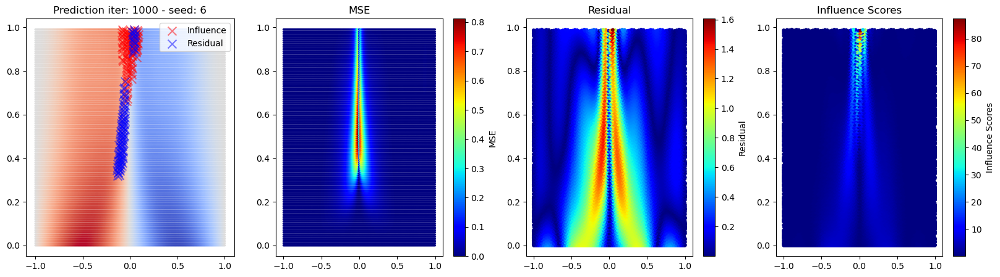

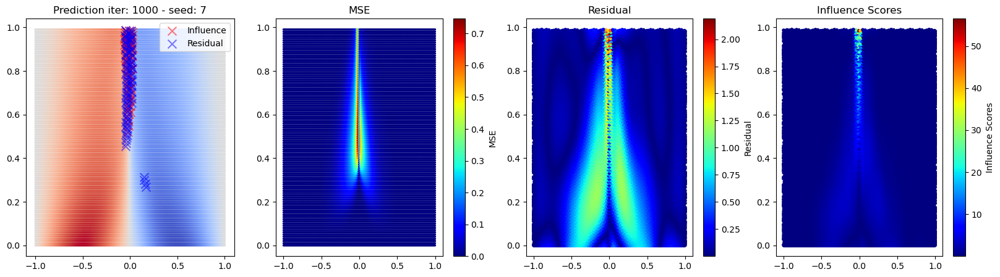

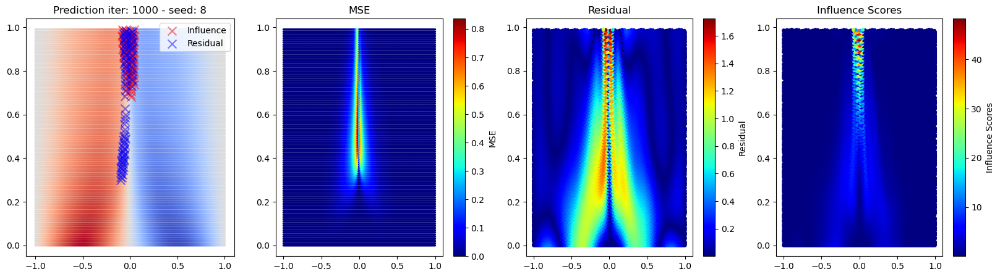

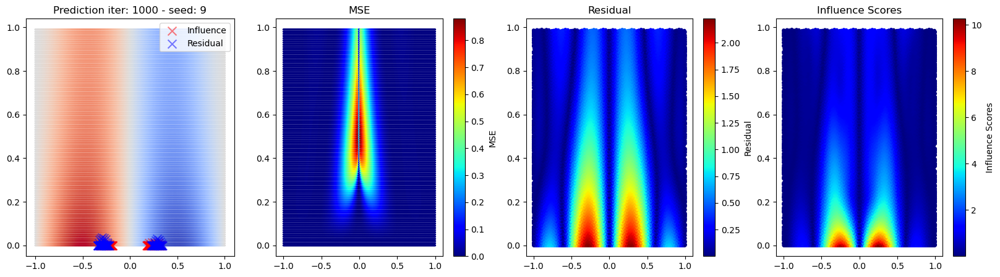

In [5]:
n_iter = 1000

topk = 100

for seed in range(10):
    model.net.load_state_dict(torch.load(f"../model_zoo_src/adam_{n_iter}_best_seed_{seed}_hardconstrained.pt")['model_state_dict'])
    if_arrs = np.load(f"../model_zoo_src/influence_scores_{n_iter}_2540_80_160_{seed}_hc_True.npz")
    influence_scores = if_arrs['influence_scores']
    candidate_points = if_arrs['candidate_points']
    pred = model.predict(X)

    residual = np.abs(model.predict(candidate_points, operator=burgers_equation)[:,0])
    infl = np.abs(influence_scores).sum(axis=0)

    topk_infl = np.argsort(infl)[-topk:]
    topk_res = np.argsort(residual)[-topk:]
    
    fig, ax = plt.subplots(ncols=4, figsize=(20, 5))
    ax[0].scatter(*X.T, c=pred, cmap="coolwarm", s=2)
    ax[0].set_title(f"Prediction iter: {n_iter} - seed: {seed}")

    ax[0].scatter(*candidate_points[topk_infl].T, c="r", marker='x', s=100, label="Influence", alpha=0.5)
    ax[0].scatter(*candidate_points[topk_res].T, c="b", marker='x', s=100, label="Residual", alpha=0.5)

    ax[0].legend()

    sc = ax[1].scatter(*X.T, c=np.square(pred - y), cmap="jet", s=2)
    plt.colorbar(sc, ax=ax[1], label="MSE")
    ax[1].set_title("MSE")
    sc = ax[2].scatter(*candidate_points.T, c=residual, cmap="jet", s=10)
    plt.colorbar(sc, ax=ax[2], label="Residual")
    ax[2].set_title(f"Residual")

    sc = ax[3].scatter(*candidate_points.T, c=infl, cmap="jet", s=10)
    plt.colorbar(sc, ax=ax[3], label="Influence Scores")
    ax[3].set_title("Influence Scores")
    plt.show()

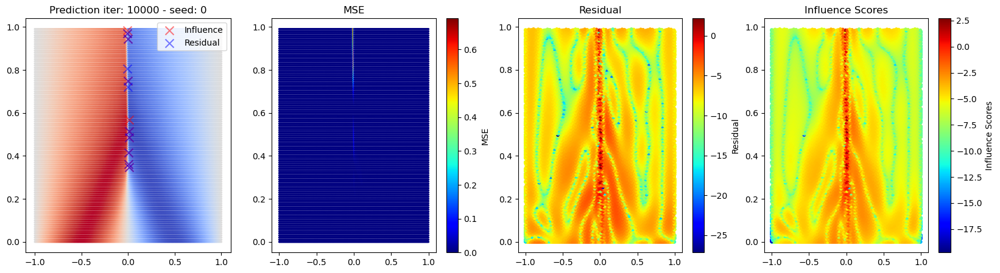

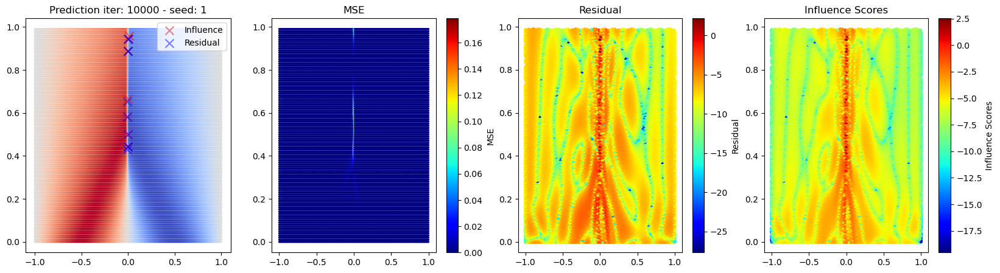

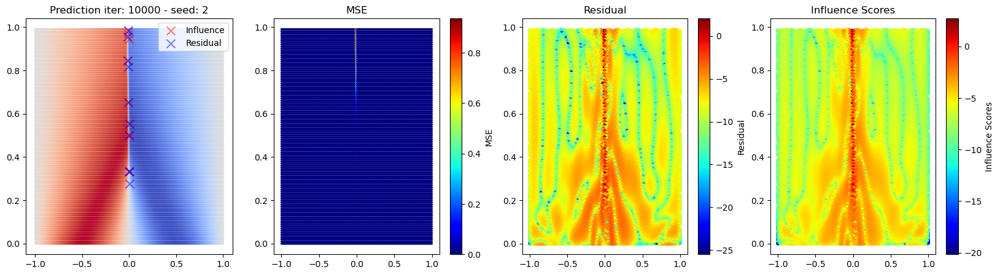

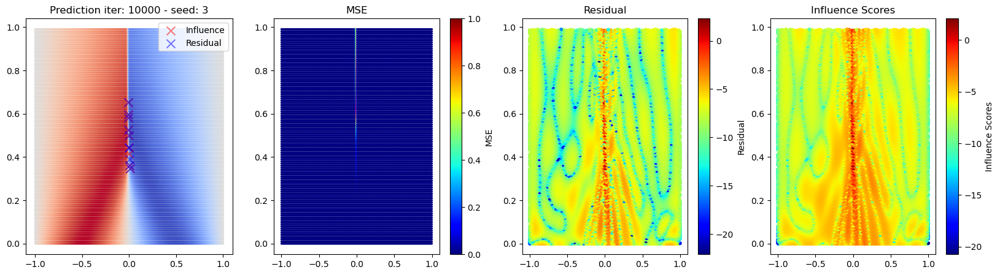

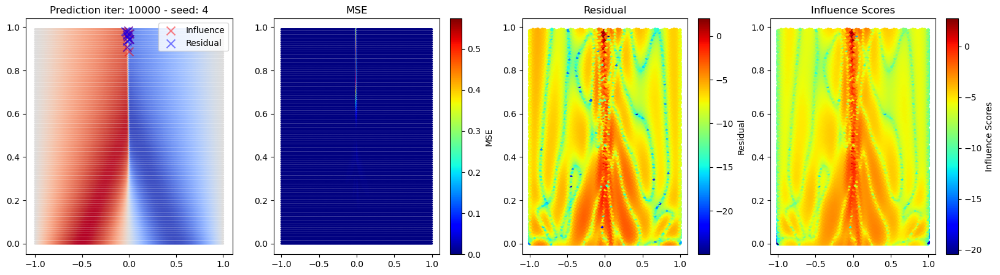

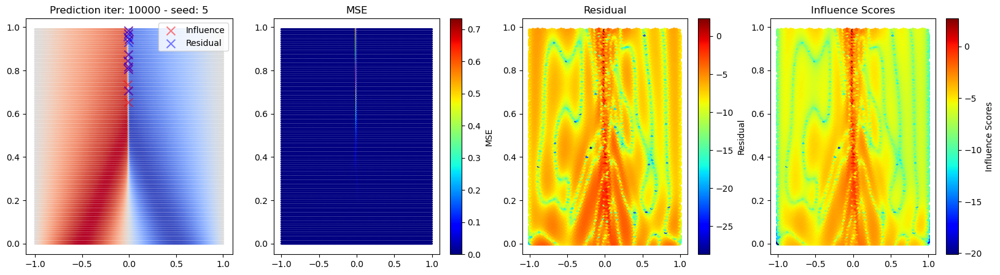

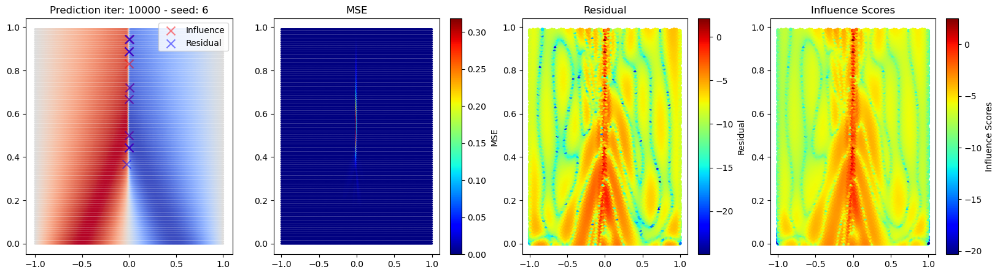

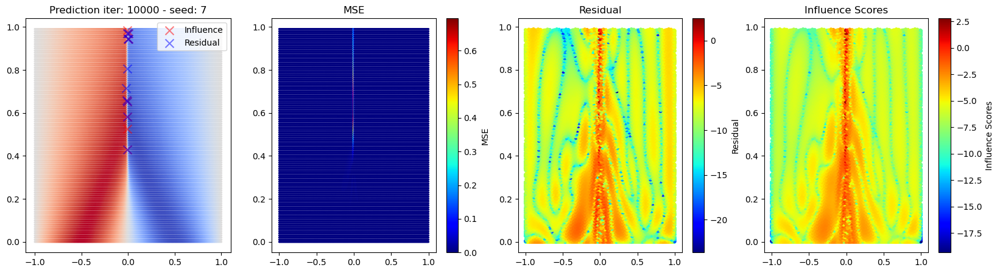

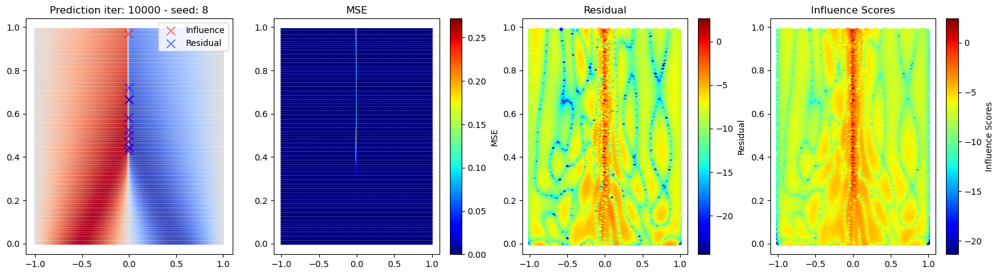

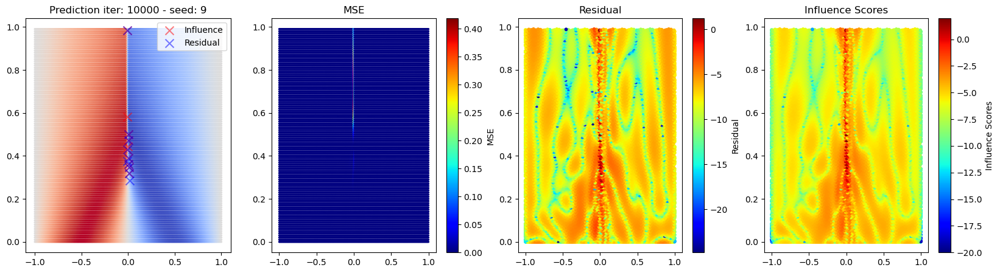

In [9]:
n_iter = 10000

topk = 10

for seed in range(10):
    model.net.load_state_dict(torch.load(f"../model_zoo_src/adam_{n_iter}_best_seed_{seed}_hardconstrained.pt")['model_state_dict'])
    if_arrs = np.load(f"../model_zoo_src/influence_scores_{n_iter}_2540_80_160_{seed}_hc_True.npz")
    influence_scores = if_arrs['influence_scores']
    candidate_points = if_arrs['candidate_points']
    pred = model.predict(X)

    residual = np.log(np.square(model.predict(candidate_points, operator=burgers_equation)[:,0]))
    infl = np.log(np.abs(influence_scores).sum(axis=0))

    topk_infl = np.argsort(infl)[-topk:]
    topk_res = np.argsort(residual)[-topk:]
    
    fig, ax = plt.subplots(ncols=4, figsize=(20, 5))
    ax[0].scatter(*X.T, c=pred, cmap="coolwarm", s=2)
    ax[0].set_title(f"Prediction iter: {n_iter} - seed: {seed}")

    ax[0].scatter(*candidate_points[topk_infl].T, c="r", marker='x', s=100, label="Influence", alpha=0.5)
    ax[0].scatter(*candidate_points[topk_res].T, c="b", marker='x', s=100, label="Residual", alpha=0.5)

    ax[0].legend()

    sc = ax[1].scatter(*X.T, c=np.square(pred - y), cmap="jet", s=2)
    plt.colorbar(sc, ax=ax[1], label="MSE")
    ax[1].set_title("MSE")
    sc = ax[2].scatter(*candidate_points.T, c=residual, cmap="jet", s=10)
    plt.colorbar(sc, ax=ax[2], label="Residual")
    ax[2].set_title(f"Residual")

    sc = ax[3].scatter(*candidate_points.T, c=infl, cmap="jet", s=10)
    plt.colorbar(sc, ax=ax[3], label="Influence Scores")
    ax[3].set_title("Influence Scores")
    plt.show()

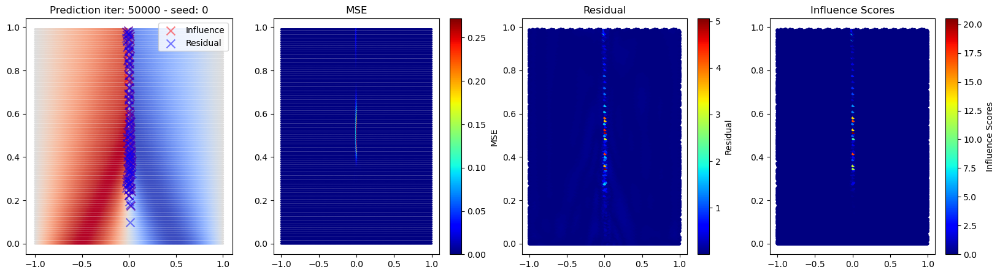

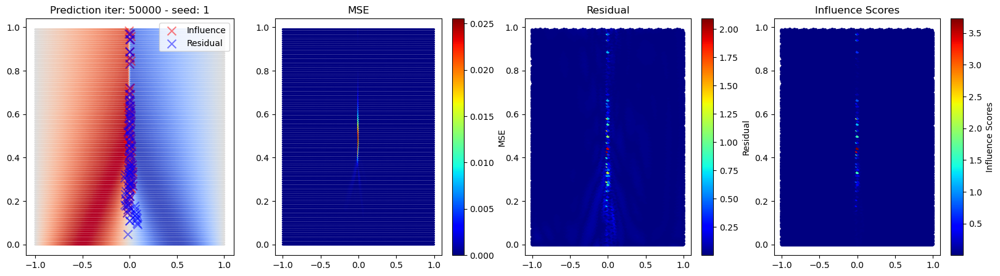

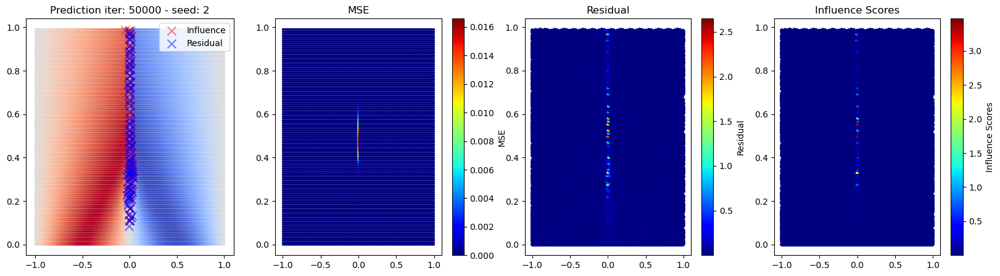

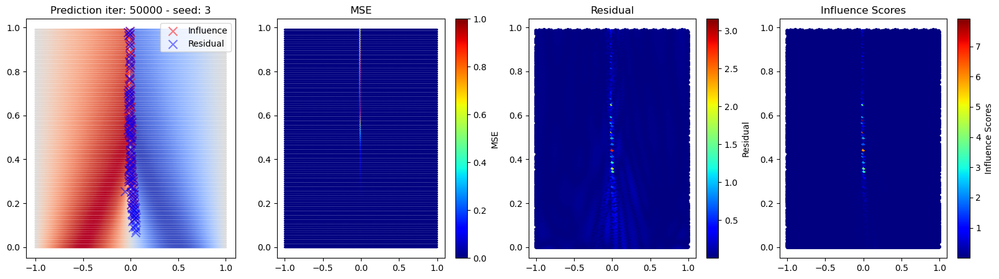

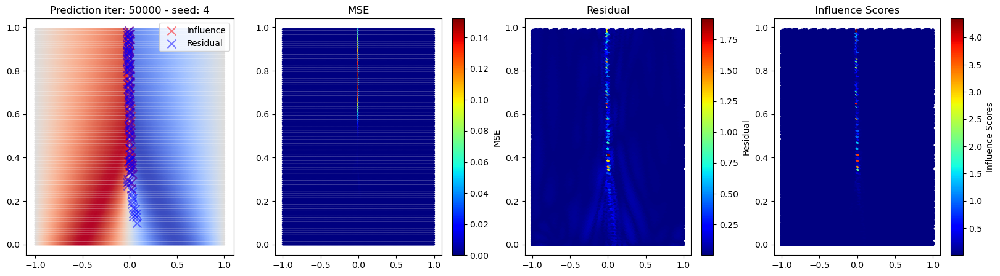

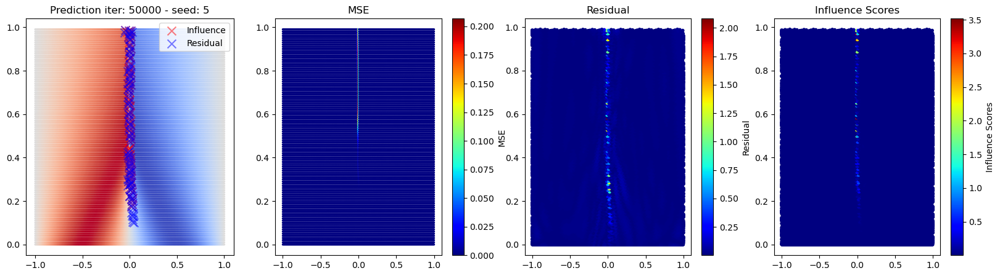

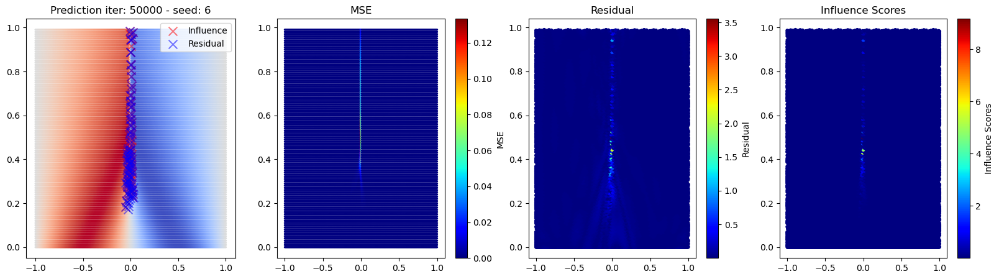

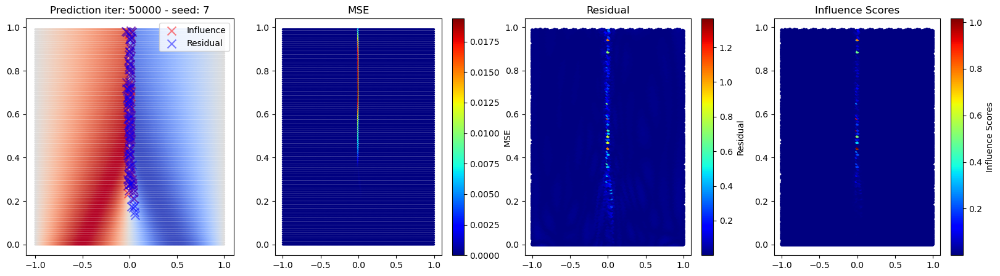

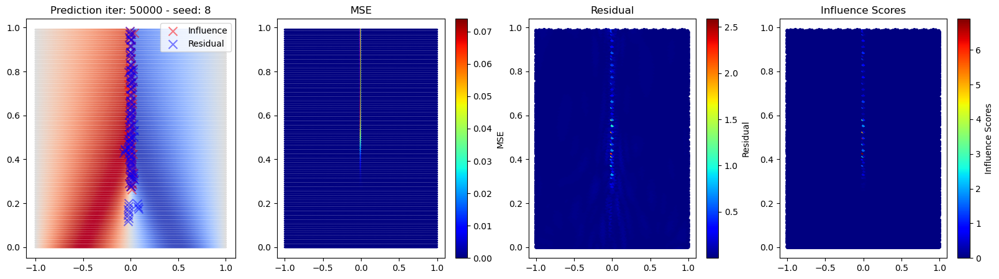

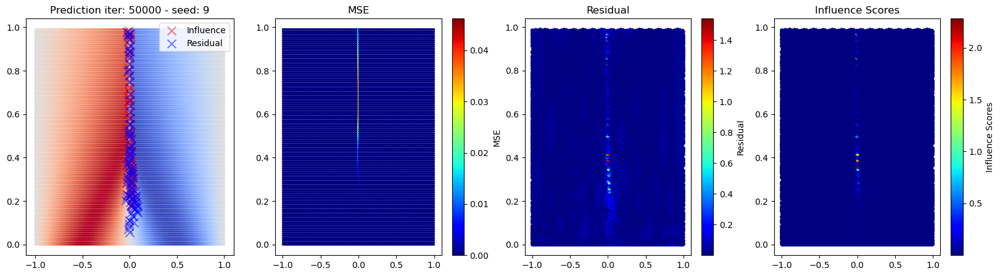

In [7]:
n_iter = 50000

topk = 100

for seed in range(10):
    model.net.load_state_dict(torch.load(f"../model_zoo_src/adam_{n_iter}_best_seed_{seed}_hardconstrained.pt")['model_state_dict'])
    if_arrs = np.load(f"../model_zoo_src/influence_scores_{n_iter}_2540_80_160_{seed}_hc_True.npz")
    influence_scores = if_arrs['influence_scores']
    candidate_points = if_arrs['candidate_points']
    pred = model.predict(X)

    residual = np.abs(model.predict(candidate_points, operator=burgers_equation)[:,0])
    infl = np.abs(influence_scores).sum(axis=0)

    topk_infl = np.argsort(infl)[-topk:]
    topk_res = np.argsort(residual)[-topk:]
    
    fig, ax = plt.subplots(ncols=4, figsize=(20, 5))
    ax[0].scatter(*X.T, c=pred, cmap="coolwarm", s=2)
    ax[0].set_title(f"Prediction iter: {n_iter} - seed: {seed}")

    ax[0].scatter(*candidate_points[topk_infl].T, c="r", marker='x', s=100, label="Influence", alpha=0.5)
    ax[0].scatter(*candidate_points[topk_res].T, c="b", marker='x', s=100, label="Residual", alpha=0.5)

    ax[0].legend()

    sc = ax[1].scatter(*X.T, c=np.square(pred - y), cmap="jet", s=2)
    plt.colorbar(sc, ax=ax[1], label="MSE")
    ax[1].set_title("MSE")
    sc = ax[2].scatter(*candidate_points.T, c=residual, cmap="jet", s=10)
    plt.colorbar(sc, ax=ax[2], label="Residual")
    ax[2].set_title(f"Residual")

    sc = ax[3].scatter(*candidate_points.T, c=infl, cmap="jet", s=10)
    plt.colorbar(sc, ax=ax[3], label="Influence Scores")
    ax[3].set_title("Influence Scores")
    plt.show()